In [1]:
options(warn = -1)
suppressMessages(require(Seurat))
suppressMessages(require(ggplot2))
suppressMessages(require(dplyr))
suppressMessages(require(reticulate))
suppressMessages(require(stringr))
suppressMessages(require(ggpubr))
suppressMessages(require(tidydr))
suppressMessages(require(CellTrek))
suppressMessages(require(CARD))
devtools::load_all('../Cell2Spatial/')

ℹ Loading Cell2Spatial


In [2]:
source('modules/globalParams.R')
source('modules/utils.R')
source('modules/vis.R')
source('modules/reformatProjRes.R')

In [3]:
out.figs.dir <- '../2.results/Intestinal/figs'
out.data.dir <- '../2.results/Intestinal/data'

In [4]:
dir.create(out.figs.dir, showWarnings = FALSE, recursive = TRUE)
dir.create(out.data.dir, showWarnings = FALSE, recursive = TRUE)

In [5]:
MTH_COLOR <- c(
    'Reference'    = 'grey',
    'Cell2Spatial' = '#F7B263',
    'CytoSPACE' = '#D6AA8E',
    'CellTrek' = '#99C0CC',
    'Tangram' = 'lightgreen',
    'Seurat' = '#CC00FF'
)

### Loading kidney ST and SC datasets 

In [11]:
brain.st <- readRDS('../0.data/Intestinal/Intestinal_SP.RDS')[[1]]

In [12]:
brain.sc <- readRDS('../0.data/Intestinal/Intestinal_SC2.RDS')

In [13]:
brain.st <- brain.st %>% SCTransform(., verbose = FALSE, assay = 'Spatial') %>%
    RunPCA(verbose = FALSE) %>%
    RunUMAP(dims = 1 : 30, verbose = FALSE) %>%
    FindNeighbors(., dims = 1:30, verbose = FALSE) %>%
    FindClusters(., verbose = FALSE)

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’



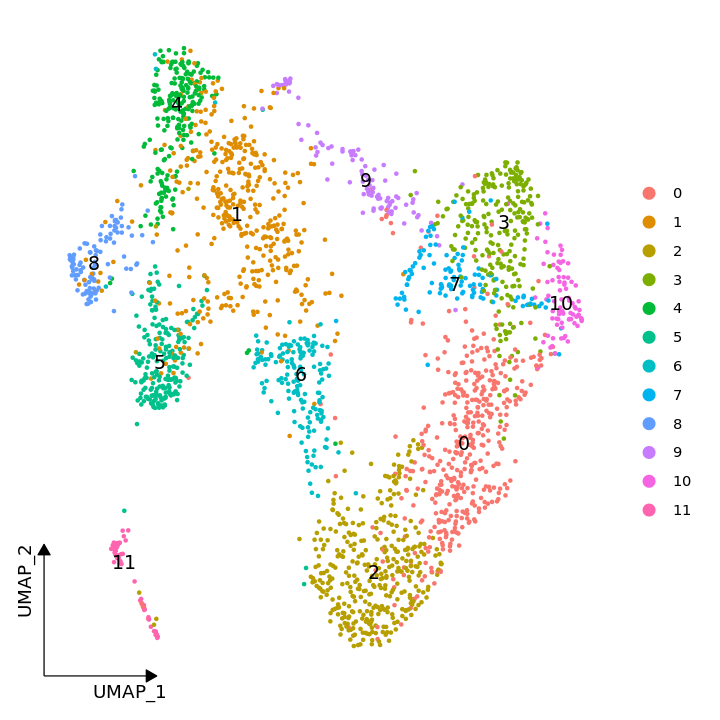

In [14]:
options(repr.plot.width = 6, repr.plot.height = 6)
DimPlot(brain.st, reduction = "umap", label = TRUE) + theme_dr(xlength = 0.2, ylength = 0.2, arrow = grid::arrow(length = unit(0.1, "inches"), ends = 'last', type = "closed")) + theme(panel.grid = element_blank())
ggsave(file.path(out.figs.dir, 'Intestinal.ST.cluster.UMAP.dimplot.pdf'), width = 6, height = 6)

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


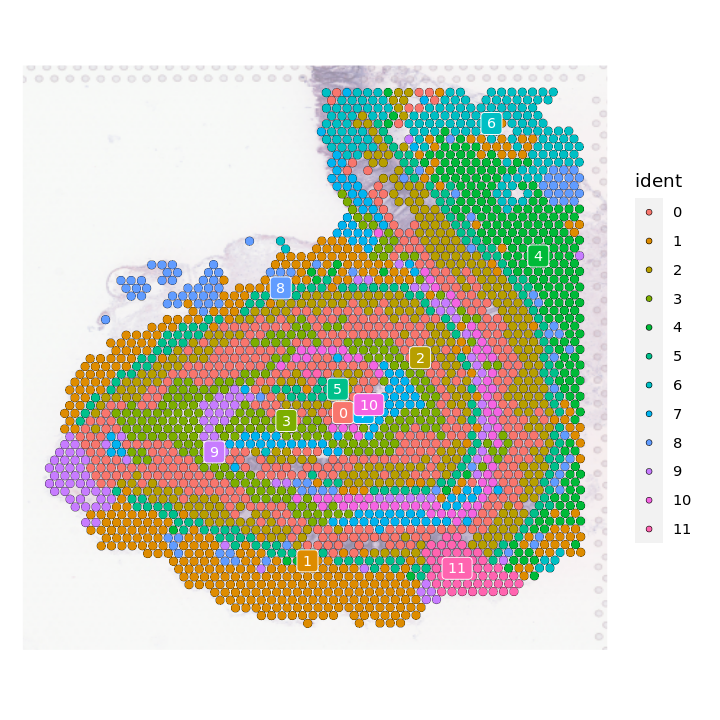

In [15]:
options(repr.plot.width = 6, repr.plot.height = 6)
SpatialDimPlot(brain.st, label = TRUE, label.size = 3, image.alpha = 0.5)
ggsave(file.path(out.figs.dir, 'Intestinal.ST.cluster.UMAP.spatial.pdf'), width = 6, height = 6)

In [16]:
f.ctypes <- levels(brain.st)
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(brain.st, idents = ct) %>% Cells
    SpatialPlot(brain.st, cells.highlight = h.cells) + NoLegend() + ggtitle(ct) 
})

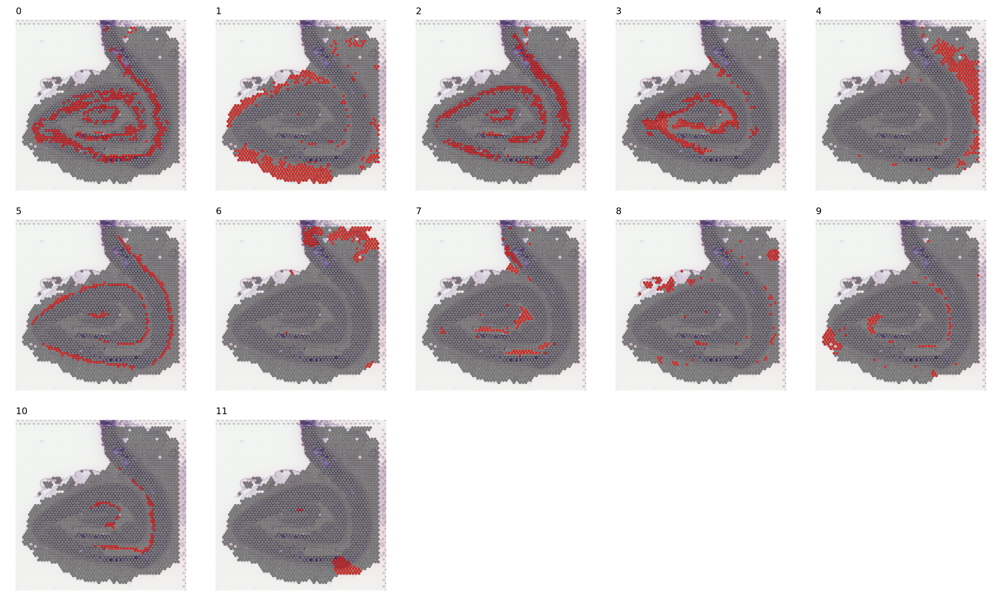

In [30]:
options(repr.plot.width = 20, repr.plot.height = 12)
ggarrange(plotlist = gps, nrow = 3, ncol = 5)
ggsave(file.path(out.figs.dir, 'Intestinal.ST.cluster.split.UMAP.spatial.pdf'), width = 20, height = 12)

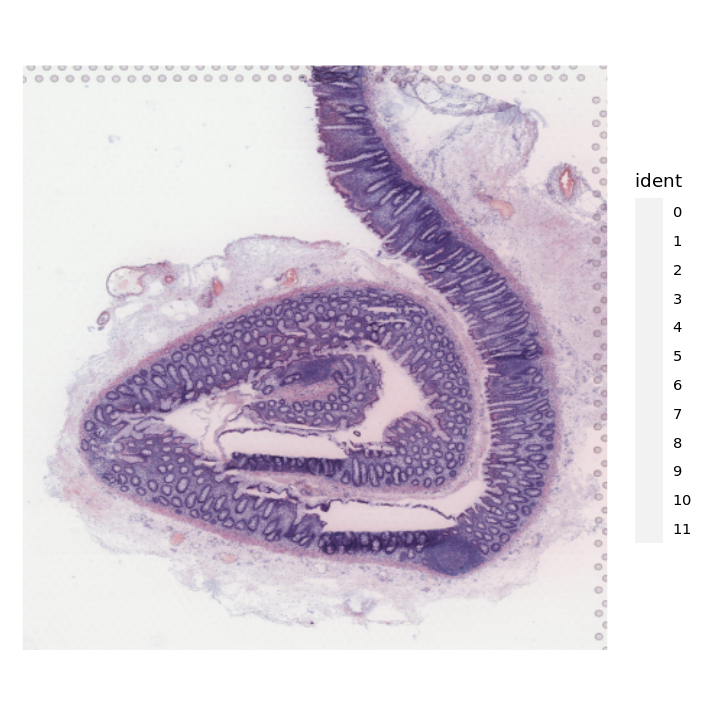

In [18]:
options(repr.plot.width = 6, repr.plot.height = 6)
SpatialDimPlot(brain.st, label = FALSE, label.size = 3,, alpha = 0)
ggsave(file.path(out.figs.dir, 'Intestinal.ST.Image.spatial.pdf'), width = 6, height = 6)

In [384]:
dim(brain.sc)

[1] 22247 81957

In [19]:
brain.st@meta.data %>% head

,orig.ident,nCount_Spatial,nFeature_Spatial,nCount_SCT,nFeature_SCT,SCT_snn_res.0.8,seurat_clusters
,<fct>,<dbl>,<int>,<dbl>,<int>,<fct>,<fct>
AAACAAGTATCTCCCA-1,SeuratProject,4249,2095,3079,2019,5,5
AAACAGAGCGACTCCT-1,SeuratProject,2775,1742,2676,1742,2,2
AAACATTTCCCGGATT-1,SeuratProject,6747,2878,3281,2098,5,5
AAACCACTACACAGAT-1,SeuratProject,1128,673,1987,690,6,6
AAACCCGAACGAAATC-1,SeuratProject,2304,1315,2319,1315,0,0
AAACCGGAAATGTTAA-1,SeuratProject,2612,1312,2544,1312,4,4


In [20]:
brain.sc@meta.data %>% head

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,S.Score,G2M.Score,Phase,old.ident,RNA_snn_res.1.5,seurat_clusters,cellType,mainCtype
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<fct>,<fct>,<fct>,<fct>,<chr>
EPI_AAACCCAGTGAATTAG-1_1,EPI,1368,696,4.605263,-0.05182568,-0.05159637,G1,raw,10,10,Proximal Enterocytes,Epithelial
EPI_AAACGAAGTCACAATC-1_1,EPI,11510,2966,4.847958,-0.24003029,-0.41138987,G1,raw,10,10,Proximal Enterocytes,Epithelial
EPI_AAACGAAGTGAGCCAA-1_1,EPI,12918,3032,2.508128,-0.39971395,-0.45316608,G1,raw,14,14,Distal Enterocytes,Epithelial
EPI_AAACGCTAGAGTATAC-1_1,EPI,14164,3208,2.682858,-0.39685344,-0.67594392,G1,raw,20,20,Distal Enterocytes,Epithelial
EPI_AAACGCTAGGAAAGAC-1_1,EPI,9786,2360,5.129777,-0.15135453,-0.27072618,G1,raw,14,14,Distal Enterocytes,Epithelial
EPI_AAACGCTAGTAGCATA-1_1,EPI,14114,3621,6.426243,-0.43656402,-0.56798872,G1,raw,19,19,Myofibroblast Progenitors,Fibroblasts


In [21]:
Idents(brain.sc) <- brain.sc$mainCtype

In [22]:
brain.sc <- SCTransform(brain.sc, ncells = 3000, verbose = FALSE) %>%
    RunPCA(verbose = FALSE) %>%
    RunUMAP(dims = 1 : 30, verbose = FALSE)

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’



In [174]:
set.seed(2023063)
cell.colors <- randomcoloR::distinctColorPalette(length(unique(brain.sc$cellType))) %>% `names<-`(unique(brain.sc$cellType))

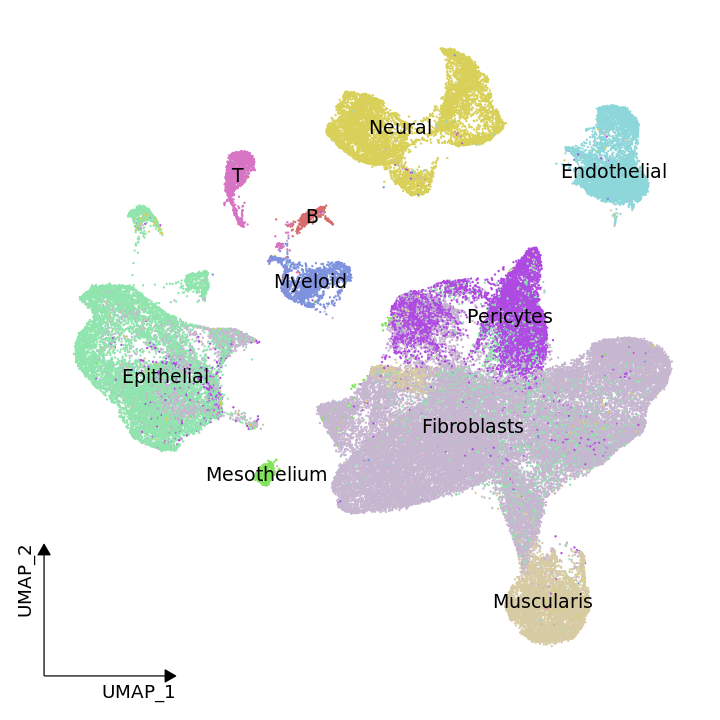

In [24]:
options(repr.plot.width = 6, repr.plot.height = 6)
DimPlot(brain.sc, label = TRUE, cols = cell.colors, raster=FALSE) + theme_dr(xlength = 0.2, ylength = 0.2, arrow = grid::arrow(length = unit(0.1, "inches"), ends = 'last', type = "closed")) + theme(panel.grid = element_blank()) + NoLegend()
ggsave(file.path(out.figs.dir, 'Intestinal.SC.cluster.UMAP.dimplot.pdf'), width = 6, height = 6)

In [25]:
levels(brain.sc) %>% length

[1] 10

In [26]:
#markers <- FindAllMarkers(brain.st, only.pos = TRUE, logfc.threshold = 0.25, min.pct = 0.25, assay = 'SCT')

In [27]:
#openxlsx::write.xlsx(markers, file = file.path(out.data.dir, 'Thymus.ST.markers.xlsx'))

In [28]:
#top20.markers <- markers %>% group_by(cluster) %>% top_n(n = 50, wt = avg_log2FC)

In [29]:
#saveRDS(brain.sc, file = file.path(out.data.dir, 'brain.sc.RDS'))
#saveRDS(brain.st, file = file.path(out.data.dir, 'brain.st.RDS'))

### Showing the projection performance for Cell2Spatial

In [367]:
cell2spatial <- readRDS('../2.results/Intestinal/data/Intestinal.cell2spatiaL.RDS')$obj

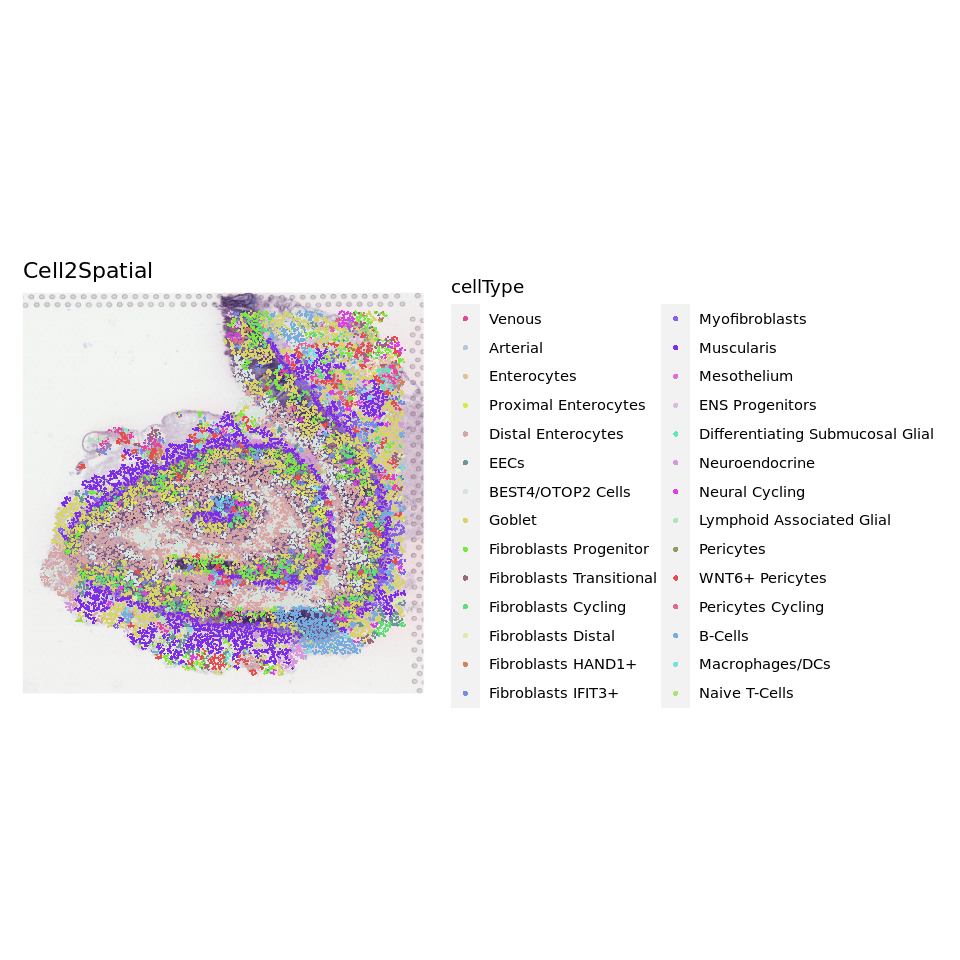

In [368]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(cell2spatial, group.by = 'cellType', pt.size = 0.6, image.alpha = 1, stroke = 0, cols = cell.colors) + ggtitle('Cell2Spatial')
ggsave(file.path(out.figs.dir, 'cell2spatial.entire.UMAP.pdf'), width = 8, height = 6)

In [369]:
length(cell2spatial$CellType %>% unique)

[1] 28

In [370]:
f.ctypes <- cell2spatial$CellType %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(cell2spatial, CellType == ct) %>% Cells
    obj.sub <- cell2spatial[, h.cells]
    SpatialDimPlot(obj.sub, image.alpha = 1, group.by = 'CellType',  pt.size.factor = 1, crop = FALSE, stroke = 0, cols = cell.colors[ct]) + ggtitle(ct) + NoLegend()  
})

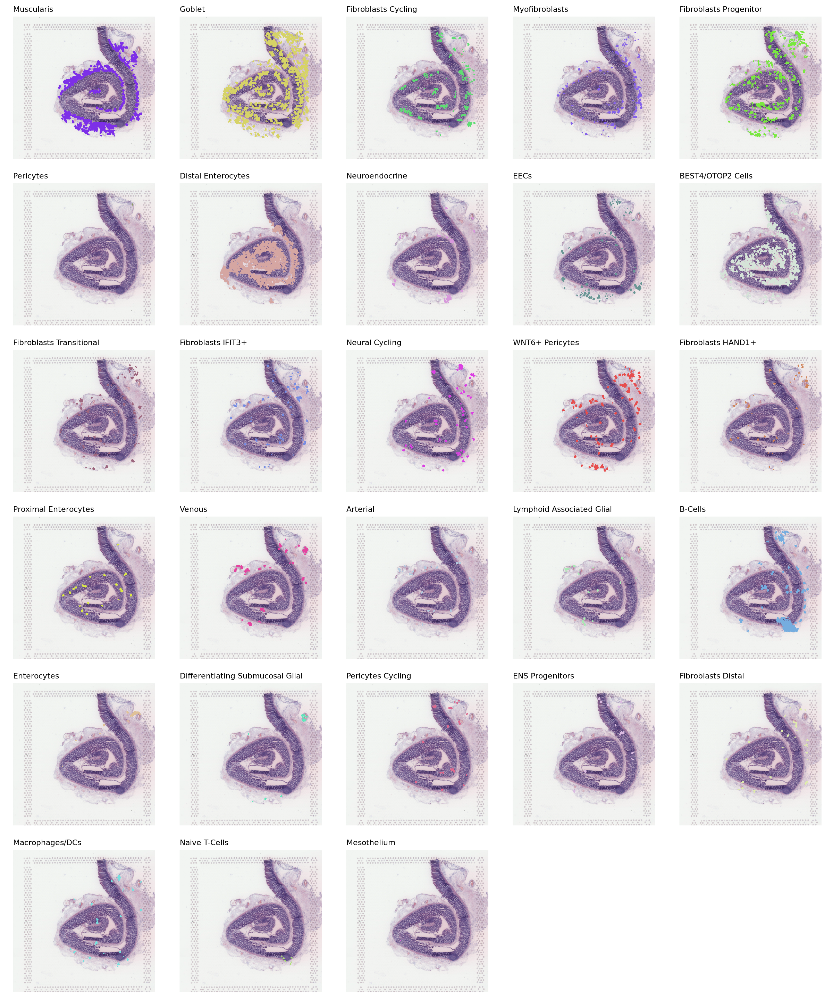

In [371]:
options(repr.plot.width = 20, repr.plot.height = 24)
ggarrange(plotlist = gps, nrow = 6, ncol = 5)
ggsave(file.path(out.figs.dir, 'cell2spatial.split.UMAP.pdf'), width = 20, height = 24)
ggsave(file.path(out.figs.dir, 'cell2spatial.split.UMAP.eps'), width = 20, height = 24)

### Showing the projection performance for CytoSpace

In [197]:
cytospace <- forCytoSpace('../2.results/Intestinal/data/cytospace/', brain.sc, brain.st)

In [198]:
head(cytospace@meta.data)

,orig.ident,nCount_Spatial,nFeature_Spatial,UniqueCID,OriginalCID,CellType,SpotID,row,col,x.new,y.new
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
UCID00000,Cell2Spatial,4240,1174,UCID00000,STR_AGAGAGCTCAGTCACA-1_7,Myofibroblast Progenitors,TACGAACACGACTTCA-1,255.2684,276.8248,255.6713,277.0565
UCID00001,Cell2Spatial,4313,1774,UCID00001,STR2_TGTTGAGAGCACTAAA-1_9,Myofibroblast Progenitors,CCACAGTACCCATCCT-1,360.2386,416.1318,357.6316,414.7686
UCID00002,Cell2Spatial,4534,1862,UCID00002,STR3_TTACTGTTCTCTTAAC-1_10,Myofibroblast Progenitors,GCTGGACCCAAAGTGG-1,149.1906,465.3792,150.7687,466.1630
UCID00003,Cell2Spatial,5560,2879,UCID00003,STR3_TCCGGGACAATGCAGG-1_10,Myofibroblast Progenitors,AAATAAGGTAGTGCCC-1,254.5016,497.7563,252.5415,496.4866
UCID00004,Cell2Spatial,5636,2882,UCID00004,STR3_GTGTCCTCATACCAGT-1_10,Myofibroblast Progenitors,CTAGGTTCGGACGTGA-1,422.4368,338.0006,420.3531,338.9926
UCID00005,Cell2Spatial,3926,946,UCID00005,Run1_CCTGTTGCAGCACCCA-1_5,Myofibroblast Progenitors,TTGTGCAGCCACGTCA-1,434.7913,352.2295,431.9234,351.4401


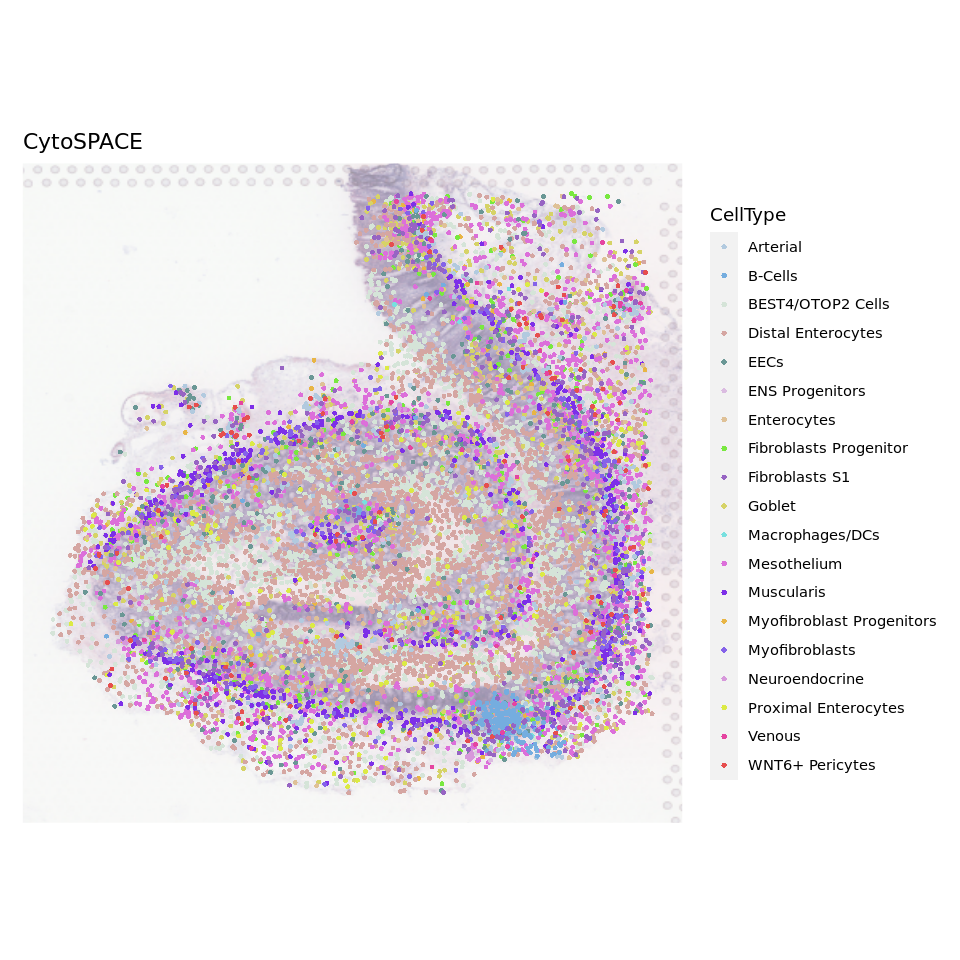

In [182]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(cytospace, group.by = 'CellType', pt.size = 0.8, image.alpha = 0.5, cols = cell.colors, stroke = 0) + ggtitle('CytoSPACE')
ggsave(file.path(out.figs.dir, 'cytospace.entire.UMAP.pdf'), width = 8, height = 6)

In [203]:
length(cytospace$CellType %>% unique)

[1] 19

In [204]:
f.ctypes <- cytospace$CellType %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(cytospace, CellType == ct) %>% Cells
    obj.sub <- cytospace[, h.cells]
    SpatialDimPlot(obj.sub, image.alpha = 1, group.by = 'CellType', cols = cell.colors[ct], pt.size.factor = 1, crop = FALSE, stroke = 0) + ggtitle(ct) + NoLegend()  
})

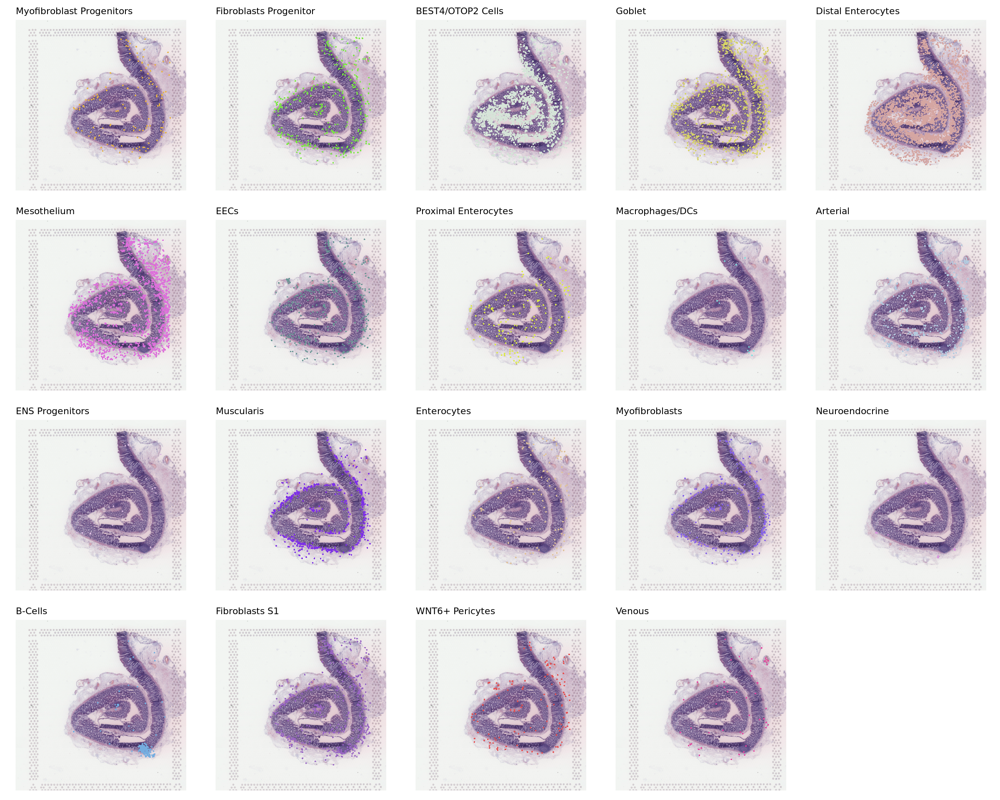

In [205]:
options(repr.plot.width = 20, repr.plot.height = 16)
ggarrange(plotlist = gps, nrow = 4, ncol = 5)
ggsave(file.path(out.figs.dir, 'cytospace.split.UMAP.pdf'), width = 20, height = 16)
ggsave(file.path(out.figs.dir, 'cytospace.split.UMAP.eps'), width = 20, height = 16)

### Showing the projection performance for tangram

In [200]:
tangram <- forTangram('../2.results/Intestinal/data/Intestinal_tangram.xls', brain.sc, brain.st)

In [201]:
tangram@meta.data %>% head

,orig.ident,nCount_Spatial,nFeature_Spatial,X,nCount_RNA,nFeature_RNA,percent.mt,S.Score,G2M.Score,Phase,old.ident,RNA_snn_res.1.5,seurat_clusters,cellType,mainCtype,SpotID,row,col,x.new,y.new
,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
EPI_AAACCCAGTGAATTAG-1_1,EPI,3691,859,EPI_AAACCCAGTGAATTAG-1_1,1368,696,4.605263,-0.05182568,-0.05159637,G1,0,10,10,Proximal Enterocytes,Epithelial,TGTTCTCTACTCCCTA-1,142.8003,525.9586,145.1405,527.3043
EPI_AAACGAAGTCACAATC-1_1,EPI,5498,2308,EPI_AAACGAAGTCACAATC-1_1,11510,2966,4.847958,-0.24003029,-0.41138987,G1,0,10,10,Proximal Enterocytes,Epithelial,AGCGATGCGCCTAATA-1,459.2445,473.5587,458.6798,473.2634
EPI_AAACGAAGTGAGCCAA-1_1,EPI,5261,1957,EPI_AAACGAAGTGAGCCAA-1_1,12918,3032,2.508128,-0.39971395,-0.45316608,G1,0,14,14,Distal Enterocytes,Epithelial,GCGAGAGTTGCGTCCA-1,267.0264,469.2985,267.8972,469.7310
EPI_AAACGCTAGAGTATAC-1_1,EPI,5078,1667,EPI_AAACGCTAGAGTATAC-1_1,14164,3208,2.682858,-0.39685344,-0.67594392,G1,0,20,20,Distal Enterocytes,Epithelial,TGACAACGCATGTCGC-1,310.2244,530.0483,309.3597,529.4881
EPI_AAACGCTAGGAAAGAC-1_1,EPI,5605,2113,EPI_AAACGCTAGGAAAGAC-1_1,9786,2360,5.129777,-0.15135453,-0.27072618,G1,0,14,14,Distal Enterocytes,Epithelial,GCGAGCGCATGCTCCC-1,291.8205,476.5408,289.8451,477.4812
EPI_AAACGCTAGTAGCATA-1_1,EPI,5024,1899,EPI_AAACGCTAGTAGCATA-1_1,14114,3621,6.426243,-0.43656402,-0.56798872,G1,0,19,19,Myofibroblast Progenitors,Fibroblasts,ATTGGATTACAGCGTA-1,397.3019,451.9171,396.9417,451.8179


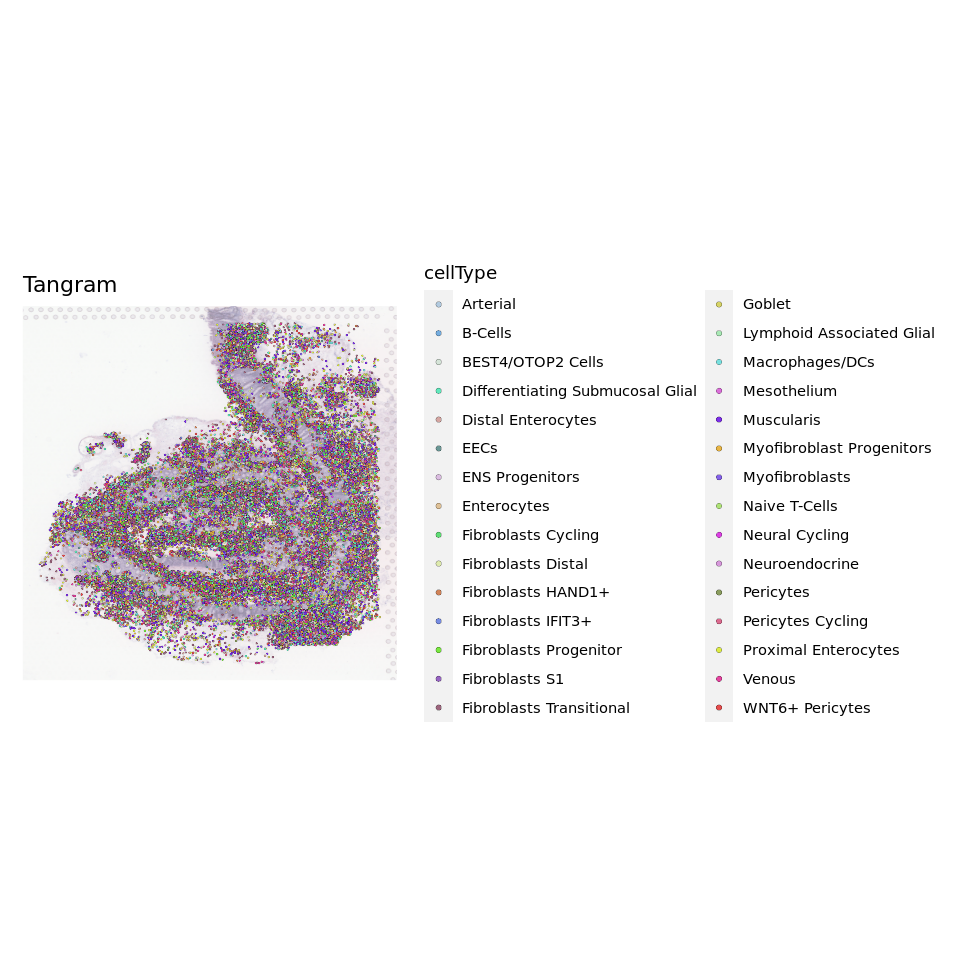

In [206]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(tangram, group.by = 'cellType', pt.size = 0.6, image.alpha = 0.5, cols = cell.colors, stroke = 0.1) + ggtitle('Tangram')
ggsave(file.path(out.figs.dir, 'tangram.entire.UMAP.pdf'), width = 8, height = 6)

In [207]:
length(f.ctypes <- tangram$cellType %>% unique)

[1] 30

In [209]:
f.ctypes <- tangram$cellType %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(tangram, cellType == ct) %>% Cells
    obj.sub <- tangram[, h.cells]
    SpatialDimPlot(obj.sub, image.alpha = 0.5, group.by = 'cellType', cols = cell.colors[ct], pt.size.factor = 1, crop = FALSE, stroke = 0) + ggtitle(ct) + NoLegend()  
})

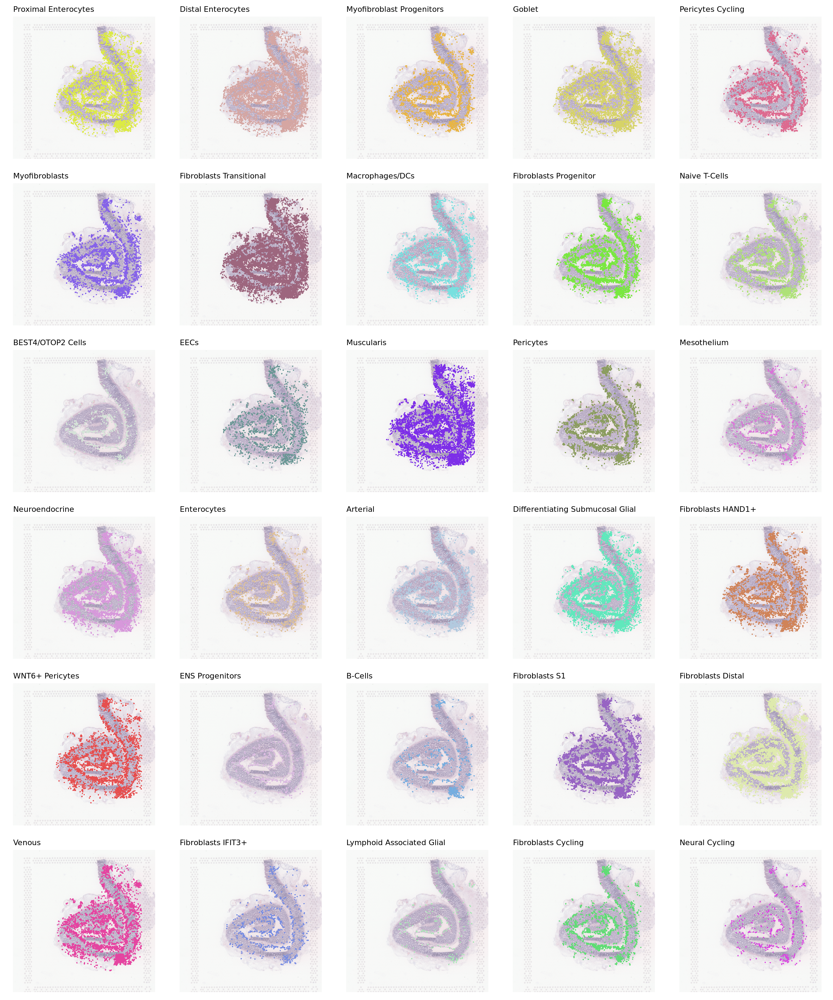

In [212]:
options(repr.plot.width = 20, repr.plot.height = 24)
ggarrange(plotlist = gps, nrow = 6, ncol = 5)
ggsave(file.path(out.figs.dir, 'tangram.split.UMAP.pdf'), width = 20, height = 24)
ggsave(file.path(out.figs.dir, 'tangram.split.UMAP.eps'), width = 20, height = 24)

### Showing the projection performance for Celltrek

In [213]:
cell.trek <- readRDS('../2.results/Intestinal/data/Intestinal.celltrek.RDS') %>% { forCellTrek(list(xx = .), brain.sc, brain.st) }

In [215]:
saveRDS(cell.trek, file = file.path(out.data.dir, 'celltrek.reformat.RDS'))

In [67]:
cell.trek <- readRDS(file = file.path(out.data.dir, 'celltrek.reformat.RDS'))

In [74]:
cell.trek@meta.data %>% head

,orig.ident,nCount_Spatial,nFeature_Spatial,nCount_RNA,nFeature_RNA,percent.mt,S.Score,G2M.Score,Phase,old.ident,⋯,mainCtype,id_raw,id_new,coord_x,coord_y,Spot,centerX,centerY,imagerow,imagecol
,<chr>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<fct>,⋯,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
STR_AAACCCAAGGGCTGAT-1_7,STR,5504,2764,12405,3762,2.152358,0.91267037,1.30129158,G2M,raw,⋯,Neural,STR_AAACCCAAGGGCTGAT-1_7,STR_AAACCCAAGGGCTGAT.1_7,1852.250,4919.774,CAGCCTCTCCTCAAGA-1,155.4956,426.1858,157.8174,419.1799
STR_AGTCATGAGTCATTGC-1_7,STR,4918,2083,5087,2083,1.376057,0.02725896,-0.12427135,S,raw,⋯,Neural,STR_AGTCATGAGTCATTGC-1_7,STR_AGTCATGAGTCATTGC.1_7,1696.677,4908.523,GCAACCACCAGACCGG-1,149.3610,415.4502,144.5621,418.2212
STR1_GTTCCGTGTCAAGCGA-1_8,STR1,5850,3379,9690,3618,2.487100,0.57563520,-0.04542424,S,raw,⋯,Neural,STR1_GTTCCGTGTCAAGCGA-1_8,STR1_GTTCCGTGTCAAGCGA.1_8,1809.611,5001.344,CAGCCTCTCCTCAAGA-1,155.4956,426.1858,154.1844,426.1298
STR1_TACCTGCCATAATGCC-1_8,STR1,5049,2411,14070,4309,1.144279,1.45667171,0.66260906,S,raw,⋯,Neural,STR1_TACCTGCCATAATGCC-1_8,STR1_TACCTGCCATAATGCC.1_8,1817.399,4941.193,CAGCCTCTCCTCAAGA-1,155.4956,426.1858,154.8480,421.0048
STR1_TCTCAGCAGAACTGAT-1_8,STR1,5617,3078,8491,3179,1.613473,0.52936227,0.14789309,S,raw,⋯,Neural,STR1_TCTCAGCAGAACTGAT-1_8,STR1_TCTCAGCAGAACTGAT.1_8,1663.019,4984.488,TCACTACGACCAATGC-1,143.1412,426.1006,141.6943,424.6936
STR_TACAACGAGGGATCTG-1_7,STR,4941,1585,5265,1585,3.380817,-0.15438331,-0.28248943,G1,raw,⋯,T,STR_TACAACGAGGGATCTG-1_7,STR_TACAACGAGGGATCTG.1_7,5087.035,5172.399,GCCTCCGACAATTCAC-1,434.5357,437.7734,433.4310,440.7042


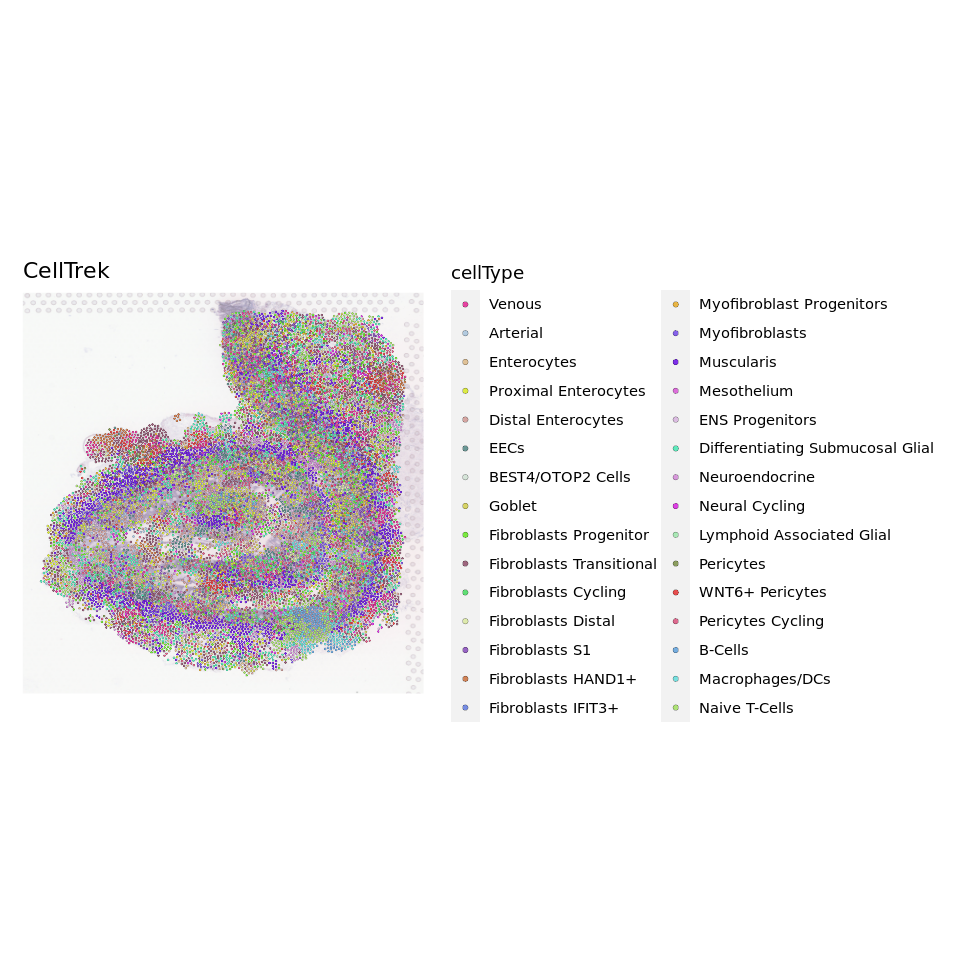

In [216]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(cell.trek, group.by = 'cellType', pt.size = 0.6, image.alpha = 0.5, cols = cell.colors, stroke = 0.1) + ggtitle('CellTrek')
ggsave(file.path(out.figs.dir, 'celltrek.entire.UMAP.pdf'), width = 8, height = 6)

In [218]:
length(f.ctypes <- cell.trek$cellType %>% unique)

[1] 30

In [219]:
f.ctypes <- cell.trek$cellType %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(cell.trek, cellType == ct) %>% Cells
    obj.sub <- cell.trek[, h.cells]
    SpatialDimPlot(obj.sub, image.alpha = 1, group.by = 'cellType', cols = cell.colors[ct], pt.size.factor = 1, crop = FALSE, stroke = 0) + ggtitle(ct) + NoLegend()  
})

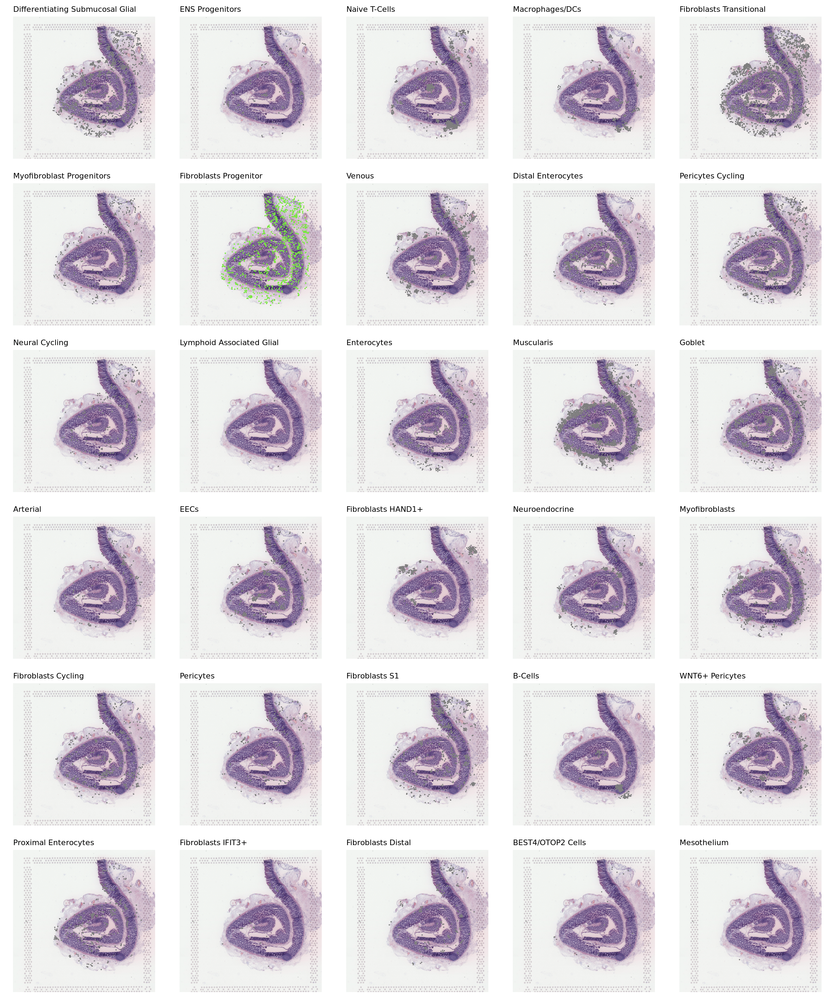

In [220]:
options(repr.plot.width = 20, repr.plot.height = 24)
ggarrange(plotlist = gps, nrow = 6, ncol = 5)
ggsave(file.path(out.figs.dir, 'celltrek.split.UMAP.pdf'), width = 20, height = 24)
ggsave(file.path(out.figs.dir, 'celltrek.split.UMAP.eps'), width = 20, height = 24)

### Showing the projection performance for Seurat

In [221]:
seurat.res <- readRDS('../2.results/Intestinal/data/Intestinal.seurat.RDS')

In [222]:
seurat.res@meta.data %>% head

,orig.ident,nCount_Spatial,nFeature_Spatial,nCount_SCT,nFeature_SCT,predicted.id,prediction.score.Proximal.Enterocytes,prediction.score.Distal.Enterocytes,prediction.score.Myofibroblast.Progenitors,prediction.score.Goblet,⋯,prediction.score.ENS.Progenitors,prediction.score.B.Cells,prediction.score.Fibroblasts.S1,prediction.score.Fibroblasts.Distal,prediction.score.Venous,prediction.score.Fibroblasts.IFIT3.,prediction.score.Lymphoid.Associated.Glial,prediction.score.Fibroblasts.Cycling,prediction.score.Neural.Cycling,prediction.score.max
,<fct>,<dbl>,<int>,<dbl>,<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAACAAGTATCTCCCA-1,SeuratProject,4245,2092,3073,2018,Muscularis,0.000000000,0.1402484,0,0.06283579,⋯,0,0.0000000,0.000000000,0,0.00000000,0,0,0,0,0.4812446
AAACAGAGCGACTCCT-1,SeuratProject,2773,1740,2668,1740,Goblet,0.000000000,0.1638253,0,0.50439315,⋯,0,0.0000000,0.000000000,0,0.00000000,0,0,0,0,0.5043931
AAACATTTCCCGGATT-1,SeuratProject,6744,2876,3198,2027,B-Cells,0.000000000,0.0000000,0,0.00000000,⋯,0,0.2436512,0.000000000,0,0.23714061,0,0,0,0,0.2436512
AAACCACTACACAGAT-1,SeuratProject,1126,671,2023,689,Goblet,0.000000000,0.1782545,0,0.41805185,⋯,0,0.0000000,0.000000000,0,0.03752433,0,0,0,0,0.4180518
AAACCCGAACGAAATC-1,SeuratProject,2300,1313,2316,1313,Distal Enterocytes,0.015335584,0.4240526,0,0.27637232,⋯,0,0.0000000,0.013225935,0,0.00000000,0,0,0,0,0.4240526
AAACCGGAAATGTTAA-1,SeuratProject,2605,1309,2537,1309,Goblet,0.007212914,0.2141278,0,0.41875650,⋯,0,0.0000000,0.007412448,0,0.00000000,0,0,0,0,0.4187565


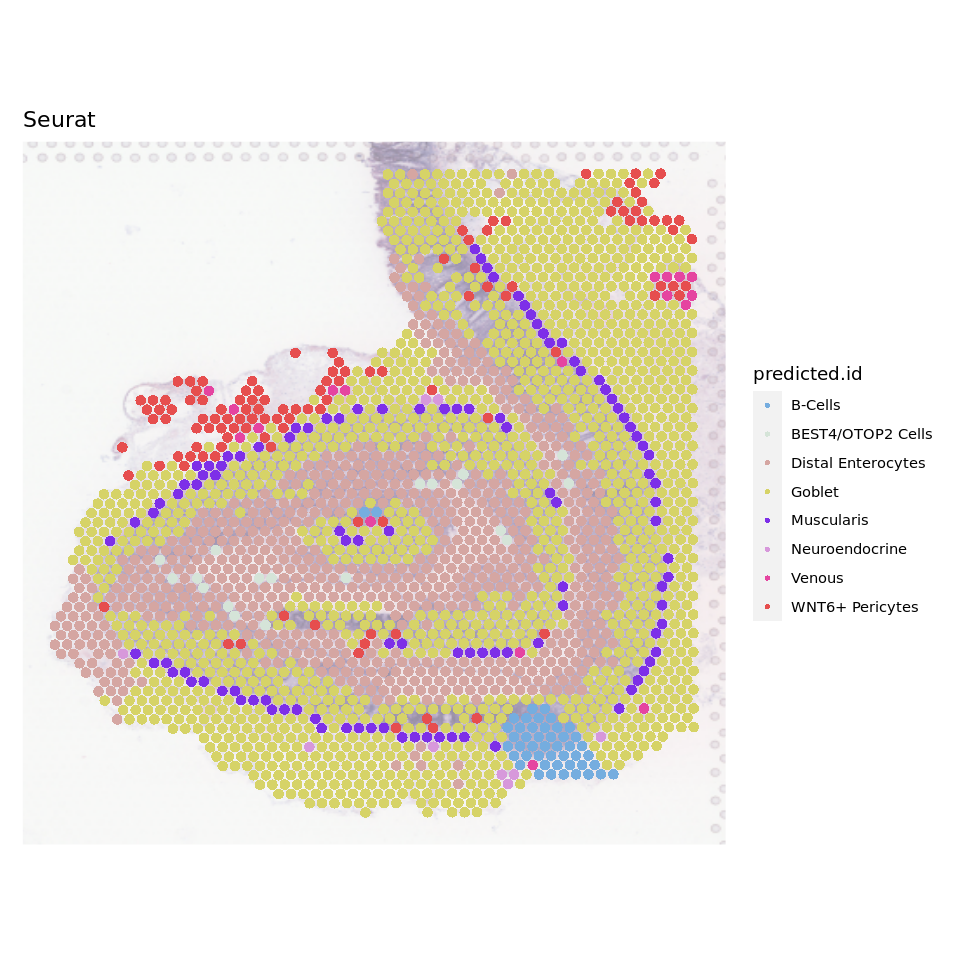

In [223]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(seurat.res, group.by = 'predicted.id', pt.size = 1.6, image.alpha = 0.5, cols = cell.colors, stroke = 0) + ggtitle('Seurat')
ggsave(file.path(out.figs.dir, 'seurat.entire.UMAP.pdf'), width = 8, height = 6)

In [224]:
length(f.ctypes <- seurat.res$predicted.id %>% unique)

[1] 8

In [225]:
f.ctypes <- seurat.res$predicted.id %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(seurat.res, predicted.id == ct) %>% Cells
    obj.sub <- seurat.res[, h.cells]
    SpatialDimPlot(obj.sub, image.alpha = 1, group.by = 'predicted.id', cols = cell.colors[ct], pt.size.factor = 1, crop = FALSE, stroke = 0) + ggtitle(ct) + NoLegend()  
})

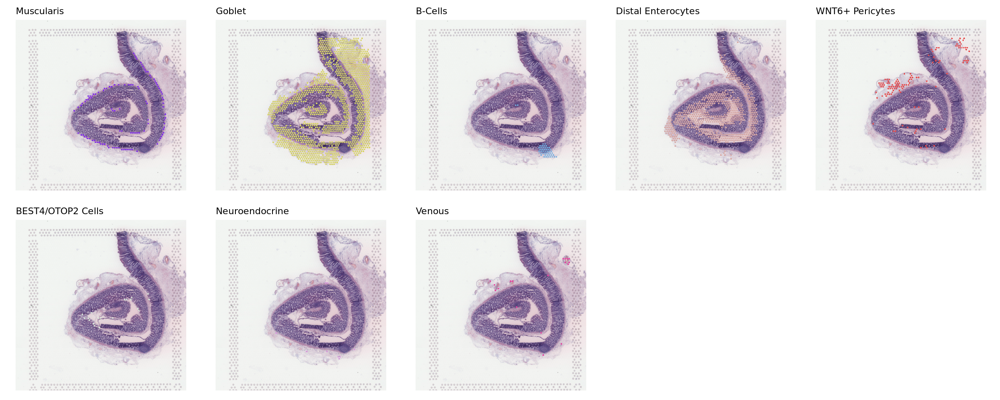

In [226]:
options(repr.plot.width = 20, repr.plot.height = 8)
ggarrange(plotlist = gps, nrow = 2, ncol = 5)
ggsave(file.path(out.figs.dir, 'seurat.split.UMAP.pdf'), width = 12, height = 8)
ggsave(file.path(out.figs.dir, 'seurat.split.UMAP.eps'), width = 12, height = 8)

### Comparison of the performace based on cellular compositions, take CARD deconvolution results as standard

In [373]:
brain.sc$cluster <- factor(brain.sc$cellType, levels = unique(brain.sc$cellType))

In [374]:
card.res <- readRDS('../2.results/Intestinal/data/Intestinal.card.RDS')

In [375]:
prop.card <- card.res@Proportion_CARD * 10
prop.card[prop.card < 1] <- 0
prop.card <- apply(prop.card, 1, ceiling) %>% t

In [376]:
prop <- rep(0, length(levels(brain.sc$cluster))) %>% `names<-`(levels(brain.sc$cluster))
prop.card <- colSums(prop.card) / sum(prop.card) * 100
prop.card <- prop.card[names(prop)]

In [378]:
prop <- rep(0, length(levels(brain.sc$cluster))) %>% `names<-`(levels(brain.sc$cluster))
prop.cell2spatial <- cell2spatial$cellType %>% table %>% {./sum(.)} * 100
prop[names(prop.cell2spatial)] <- prop.cell2spatial
prop.cell2spatial <- prop

prop <- rep(0, length(levels(brain.sc$cluster))) %>% `names<-`(levels(brain.sc$cluster))
prop.cytospace <- cytospace$CellType %>% table %>% {./sum(.)} * 100
prop[names(prop.cytospace)] <- prop.cytospace
prop.cytospace <- prop

prop <- rep(0, length(levels(brain.sc$cluster))) %>% `names<-`(levels(brain.sc$cluster))
prop.cell.trek <- cell.trek$cellType %>% table %>% {./sum(.)} * 100
prop[names(prop.cell.trek)] <- prop.cell.trek
prop.cell.trek <- prop

prop <- rep(0, length(levels(brain.sc$cluster))) %>% `names<-`(levels(brain.sc$cluster))
prop.tangram <- tangram$cellType %>% table %>% {./sum(.)} * 100
prop[intersect(names(prop.tangram), names(prop))] <- prop.tangram[intersect(names(prop.tangram), names(prop))]
prop.tangram <- prop

prop <- rep(0, length(levels(brain.sc$cluster))) %>% `names<-`(levels(brain.sc$cluster))
prop.seurat <- seurat.res$predicted.id %>% table %>% {./sum(.)} * 100
prop[names(prop.seurat)] <- prop.seurat
prop.seurat <- prop

In [379]:
prop.df <- cbind.data.frame(CARD = prop.card, Cell2Spatial = prop.cytospace, CytoSPACE = prop.cell2spatial, CellTrek = prop.cell.trek, Tangram = prop.tangram, Seurat = prop.seurat)

In [380]:
openxlsx::write.xlsx(prop.df, file = file.path(out.data.dir, 'methods.corr.vs.card.xlsx'))

In [381]:
prop.df$CellType <- rownames(prop.df)
gps <- lapply(colnames(prop.df)[2 : (ncol(prop.df) - 1)], function(meth) {
    plot.df.sub <- prop.df[, c('CARD', meth, 'CellType')] %>% `colnames<-`(c('CARD', 'Y', 'CellType'))
    ggplot(plot.df.sub, aes(x = CARD, y = Y)) + geom_point(size = 4, aes(color = CellType)) + theme_classic() + 
        geom_smooth(method = lm, se = TRUE) + ylab(meth) + ggpubr::stat_cor(method = "pearson") + scale_color_manual(values = cell.colors)
})

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


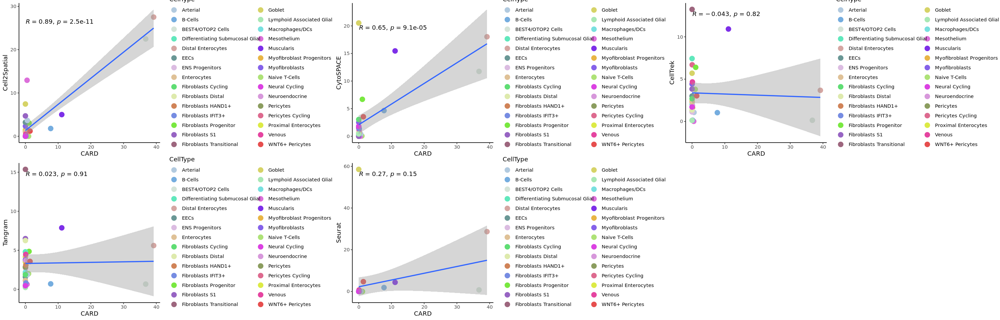

In [382]:
options(repr.plot.width = 25, repr.plot.height = 8)
ggarrange(plotlist = gps, nrow = 2, ncol = 3)
ggsave(file.path(out.figs.dir, 'methods.corr.vs.card.pdf'), width = 25, height = 8)

### Enrichment score analysis

In [110]:
table(brain.sc$cellType)


                          Venous                         Arterial 
                            3663                             1537 
                     Enterocytes             Proximal Enterocytes 
                             914                             2881 
              Distal Enterocytes                             EECs 
                            4592                             1299 
               BEST4/OTOP2 Cells                           Goblet 
                             545                             3404 
          Fibroblasts Progenitor         Fibroblasts Transitional 
                            3975                            12587 
             Fibroblasts Cycling               Fibroblasts Distal 
                            1544                             5118 
                  Fibroblasts S1               Fibroblasts HAND1+ 
                            5318                             2549 
              Fibroblasts IFIT3+        Myofibroblast Progeni

In [121]:
Idents(brain.sc) <- brain.sc$cellType

In [122]:
markers.sc <- FindAllMarkers(brain.sc, only.pos = TRUE, logfc.threshold = 0.25, min.pct = 0.25, assay = 'SCT')

Calculating cluster Venous

Calculating cluster Arterial

Calculating cluster Enterocytes

Calculating cluster Proximal Enterocytes

Calculating cluster Distal Enterocytes

Calculating cluster EECs

Calculating cluster BEST4/OTOP2 Cells

Calculating cluster Goblet

Calculating cluster Fibroblasts Progenitor

Calculating cluster Fibroblasts Transitional

Calculating cluster Fibroblasts Cycling

Calculating cluster Fibroblasts Distal

Calculating cluster Fibroblasts S1

Calculating cluster Fibroblasts HAND1+

Calculating cluster Fibroblasts IFIT3+

Calculating cluster Myofibroblast Progenitors

Calculating cluster Myofibroblasts

Calculating cluster Muscularis

Calculating cluster Mesothelium

Calculating cluster ENS Progenitors

Calculating cluster Differentiating Submucosal Glial

Calculating cluster Neuroendocrine

Calculating cluster Neural Cycling

Calculating cluster Lymphoid Associated Glial

Calculating cluster Pericytes

Calculating cluster WNT6+ Pericytes

Calculating cluster P

In [123]:
top20.markers.sc <- markers.sc %>% group_by(cluster) %>% top_n(n = 30, wt = avg_log2FC)

In [124]:
brain.st <- AddModuleScore(brain.st, features = split(top20.markers.sc$gene, top20.markers.sc$cluster))
marker.lust <- split(top20.markers.sc$gene, top20.markers.sc$cluster)

In [125]:
avgDist <- function(obj, brain.st, ctype, p.cut = 0.05) {
    res <- lapply(1 : length(names(marker.lust)), function(idx) {
        cell.name <- names(marker.lust)[idx]
        scores <- brain.st@meta.data[, paste0('Cluster', idx)] %>% `names<-`(rownames(brain.st@meta.data))
        pvals <- pnorm(scores, mean = mean(scores), sd = sd(scores), lower.tail = FALSE)
        spots <- pvals[pvals < p.cut] %>% names
        if (length(spots) == 0) return(0)
        if (!(cell.name %in% unique(obj@meta.data[, ctype]))) return(0)
        if (sum(spots %in% obj$SpotName) == 0) return(0)
        #xx <- subset(obj, SpotName %in% spots)
        xx <- obj
        if (!(cell.name %in% unique(xx@meta.data[, ctype]))) return(0)
        xx <- table(xx$SpotName, xx@meta.data[, ctype])
        #pre <- colSums(xx > 0)[cell.name]
        pre <- rownames(xx)[which(xx[, cell.name] > 0)]
        length(intersect(spots, pre)) / length(union(spots, pre)) * 100
    }) %>% unlist(.) %>% as.vector %>% mean
}

In [162]:
p.cut <- 0.01

In [164]:
xx.1 <- avgDist(cell2spatial, brain.st, 'CellType', p.cut = p.cut)
print(xx.1)

[1] 8.097723


In [165]:
cytospace$SpotName <- cytospace$SpotID 
xx.2 <- avgDist(cytospace, brain.st, 'CellType', p.cut = p.cut)
print(xx.2)

[1] 7.449871


In [166]:
cell.trek$SpotName <- cell.trek$Spot 
xx.3 <- avgDist(cell.trek, brain.st, 'cellType', p.cut = p.cut)
print(xx.3)

[1] 6.344254


In [167]:
tangram$SpotName <- tangram$SpotID
#tangram$SpotName <- gsub('-151673', '\\.151673', tangram$SpotName)
xx.4 <- avgDist(tangram, brain.st, 'cellType', p.cut = p.cut)
print(xx.4)

[1] 6.050558


In [168]:
seurat.res$SpotName <- rownames(seurat.res@meta.data)
xx.5 <- avgDist(seurat.res, brain.st, 'predicted.id', p.cut = p.cut)
print(xx.5)

[1] 7.92643


In [169]:
plot.df <- cbind.data.frame(Index = c(xx.1, xx.2, xx.3, xx.4, xx.5), Method = c('Cell2Spatial', 'CytoSPACE', 'CellTrek', 'Tangram', 'Seurat'), Data = 'DLPFC')

In [170]:
openxlsx::write.xlsx(plot.df, file = file.path(out.data.dir, 'intestinal.acc.xlsx'))

### Number of cell types projected

In [355]:
number.cts <- c(
    Reference = length(cell.colors),
    Cell2Spatial = unique(cell2spatial$CellType) %>% length, 
    CytoSPACE = unique(cytospace$CellType) %>% length, 
    CellTrek = unique(cell.trek$cellType) %>% length, 
    Tangram = unique(tangram$cellType) %>% length, 
    Seurat = unique(seurat.res$predicted.id) %>% length    
)
number.cts

Reference Cell2Spatial    CytoSPACE     CellTrek      Tangram       Seurat 
          30           28           19           30           30            8

png 
  2

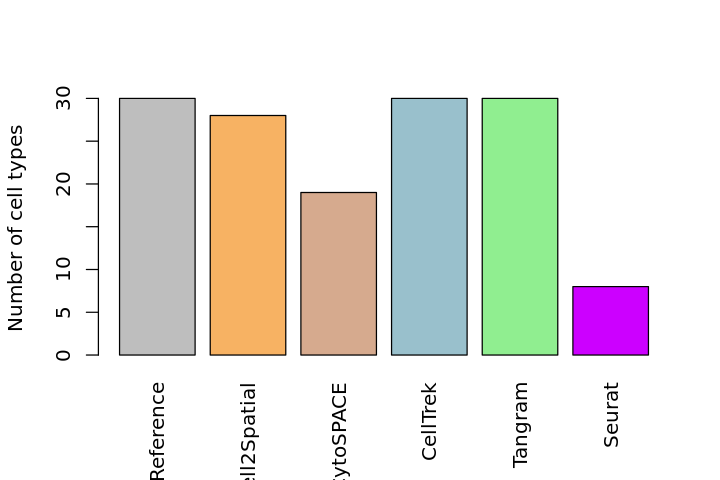

In [356]:
options(repr.plot.width = 6, repr.plot.height = 4)

pdf(file.path(out.figs.dir, 'number.of.ctypes.pdf'), width = 6, height = 4)
bp <- barplot(number.cts, las = 3, ylab = 'Number of cell types', col = MTH_COLOR)
text(bp, 20, labels = round(number.cts, digits = 2))

dev.off()
barplot(number.cts, las = 3, ylab = 'Number of cell types', col = MTH_COLOR)